# Cluster Analysis

Qui l'obiettivo sarà quello di andare a cercare gruppi e accorpamenti significativi nei dati a disposizioni con il fine di ottenere nuove informazioni. Procederemo come di seguito il primo approccio sarà andare a raggruppare le feature per tematiche logiche sul significato semantico che queste feature e i dati da esse contenute esprimono e una volta ottenute queste divisioni tematiche andremo a effettuare le tecniche di clustering per capire se i gruppi ritrovati ci permettano di discernere l'abbandono o meno del cliente oppure ci fonriscano altre informazioni utili. Alla fine del processo effettueremo un cluster usando tutte le feature attualmente in gioco e valuteremo con alcune tecniche di visulizzazione che ci permetteranno di plottare i dati multi dimensionali in un nuovo spazio bidimensionale.

Quindi partiamo da un nuovo notebook e impostiamo uno scheletro di lavoro modulare che ti permetta:
- Caricamento e preprocessing dati

*GRUPPI LOGICI* definiamo insiemi di feature legate semanticamente:<br>
- Demografia
- Comportamento/attività
- Utilizzo carta/credito
- Transazioni

*PREPROCESSING* differenziato per tipologia feature: <br>
- numeriche → StandardScaler,
- categoriche → OneHotEncoder,
- pipeline con ColumnTransformer per ogni blocco.

*CLUSTERING*: <br>
- applichi KMeans (con scelta k basata su silhouette/elbow),
- applichi DBSCAN (con grid su eps/min_samples),
- salvi etichette cluster per ogni blocco e metodo.
- Valutazione dei cluster
- silhouette score,
- numero di cluster trovati,
- dimensioni cluster,
- churn rate medio nei cluster (per vedere se discriminano bene il target).
- (Opzionale) Visualizzazione in 2D (PCA o t-SNE) solo se utile per interpretare meglio.

### Gruppi tematici di accorpamento variabili

Identificare “sottosistemi” logici ovvero blocchi naturali che si presentano nel dataset:
- Demografia: Customer_Age, Gender, Dependent_count, Education_Level, Marital_Status, Income_Category.
- Comportamento/attività: Months_on_book, Months_Inactive_12_mon, Contacts_Count_12_mon, Total_Relationship_Count.
- Utilizzo carta / credito: Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy, Avg_Utilization_Ratio.
- Transazioni: Total_Trans_Amt, Total_Trans_Ct, Total_Amt_Chng_Q4_Q1, Total_Ct_Chng_Q4_Q1.

In [1]:
# =======================
# CLUSTER ANALYSIS - BANK CHURNERS
# =======================

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# =======================
# STEP 1: Caricamento dati
# =======================
df_clean = pd.read_csv("./Dati_puliti/BankChurners_senza_predizione_NB.csv")
df_clean

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [2]:
print("=" * 60)
print("DATASET CARICATO")
print("=" * 60)
print(f"Shape dataset pulito: {df_clean.shape}")

print(f"\nColonne: {list(df_clean.columns)}")

# =======================
# STEP 2: Definizione blocchi di feature
# =======================
blocks = {
    "Demografia": [
        "Customer_Age", "Gender", "Dependent_count",
        "Education_Level", "Marital_Status", "Income_Category"
    ],
    "Comportamento": [
        "Months_on_book", "Months_Inactive_12_mon",
        "Contacts_Count_12_mon", "Total_Relationship_Count"
    ],
    "Utilizzo": [
        "Credit_Limit", "Total_Revolving_Bal",
        "Avg_Open_To_Buy", "Avg_Utilization_Ratio"
    ],
    "Transazioni": [
        "Total_Trans_Amt", "Total_Trans_Ct",
        "Total_Amt_Chng_Q4_Q1", "Total_Ct_Chng_Q4_Q1"
    ]
}

DATASET CARICATO
Shape dataset pulito: (10127, 20)

Colonne: ['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


In [4]:
# =======================
# STEP 3: Funzioni di utilità
# =======================
def build_preprocessor(features, df):
    """Crea un ColumnTransformer per numeriche (scaling) e categoriche (one-hot)."""
    numeric = df[features].select_dtypes(include=["int64", "float64"]).columns.tolist()
    categorical = df[features].select_dtypes(exclude=["int64", "float64"]).columns.tolist()
    
    transformers = []
    if numeric:
        transformers.append(("num", StandardScaler(), numeric))
    if categorical:
        transformers.append(("cat", OneHotEncoder(drop="first", sparse_output=False), categorical))
    
    preprocessor = ColumnTransformer(transformers)
    return preprocessor, numeric, categorical


def find_optimal_k(X, max_k=10):
    """Trova il k ottimale usando Elbow Method e Silhouette Score."""
    inertias = []
    silhouettes = []
    K_range = range(2, max_k + 1)
    
    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)
        inertias.append(kmeans.inertia_)
        silhouettes.append(silhouette_score(X, labels))
    
    # Trova il k ottimale (max silhouette)
    optimal_k = K_range[np.argmax(silhouettes)]
    
    return K_range, inertias, silhouettes, optimal_k


def evaluate_clusters(X, labels, target, block_name):
    """Valuta la qualità dei cluster."""
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    
    results = {
        "Block": block_name,
        "N_Clusters": n_clusters,
        "Silhouette": silhouette_score(X, labels) if n_clusters > 1 else -1,
        "Davies_Bouldin": davies_bouldin_score(X, labels) if n_clusters > 1 else -1,
        "Calinski_Harabasz": calinski_harabasz_score(X, labels) if n_clusters > 1 else -1
    }
    
    # Analisi churn per cluster
    df_temp = pd.DataFrame({"Cluster": labels, "Attrition": target})
    cluster_stats = df_temp.groupby("Cluster").agg({
        "Attrition": ["count", lambda x: (x == "Attrited Customer").sum(), 
                      lambda x: (x == "Attrited Customer").mean()]
    })
    cluster_stats.columns = ["Size", "Churned", "Churn_Rate"]
    
    return results, cluster_stats


def plot_cluster_analysis(K_range, inertias, silhouettes, optimal_k, block_name):
    """Plotta Elbow e Silhouette per trovare k ottimale."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Elbow plot
    axes[0].plot(K_range, inertias, 'bo-')
    axes[0].set_xlabel('Numero di Cluster (k)')
    axes[0].set_ylabel('Inertia')
    axes[0].set_title(f'Elbow Method - {block_name}')
    axes[0].grid(True, alpha=0.3)
    
    # Silhouette plot
    axes[1].plot(K_range, silhouettes, 'ro-')
    axes[1].axvline(optimal_k, color='g', linestyle='--', label=f'Ottimale k={optimal_k}')
    axes[1].set_xlabel('Numero di Cluster (k)')
    axes[1].set_ylabel('Silhouette Score')
    axes[1].set_title(f'Silhouette Analysis - {block_name}')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


def characterize_clusters(df, features, labels, block_name, numeric_cols, categorical_cols):
    """Caratterizza i cluster trovando le caratteristiche distintive."""
    df_analysis = df[features].copy()
    df_analysis['Cluster'] = labels
    
    print(f"\n{'=' * 60}")
    print(f"CARATTERIZZAZIONE CLUSTER - {block_name}")
    print(f"{'=' * 60}\n")
    
    # Analisi per ogni cluster
    for cluster_id in sorted(df_analysis['Cluster'].unique()):
        if cluster_id == -1:  # Noise in DBSCAN
            continue
            
        cluster_data = df_analysis[df_analysis['Cluster'] == cluster_id]
        print(f"\n--- CLUSTER {cluster_id} (n={len(cluster_data)}) ---")
        
        # Statistiche numeriche
        if numeric_cols:
            print("\nCaratteristiche numeriche medie:")
            for col in numeric_cols:
                cluster_mean = cluster_data[col].mean()
                overall_mean = df_analysis[col].mean()
                diff_pct = ((cluster_mean - overall_mean) / overall_mean) * 100
                print(f"  {col}: {cluster_mean:.2f} (media generale: {overall_mean:.2f}, diff: {diff_pct:+.1f}%)")
        
        # Statistiche categoriche
        if categorical_cols:
            print("\nDistribuzione variabili categoriche:")
            for col in categorical_cols:
                mode_val = cluster_data[col].mode()[0]
                mode_pct = (cluster_data[col] == mode_val).sum() / len(cluster_data) * 100
                print(f"  {col}: {mode_val} ({mode_pct:.1f}%)")

In [5]:
# =======================
# FUNZIONE VISUALIZZAZIONE MIGLIORATA PER DBSCAN
# =======================
def visualize_clusters_2d_enhanced(X, labels, target, block_name, method='PCA', algorithm='KMeans'):
    """
    Visualizza i cluster in 2D usando PCA o t-SNE.
    Versione migliorata che gestisce il rumore di DBSCAN.
    """
    if method == 'PCA':
        reducer = PCA(n_components=2, random_state=42)
    else:
        reducer = TSNE(n_components=2, random_state=42, perplexity=30)
    
    X_2d = reducer.fit_transform(X)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Cluster
    # Per DBSCAN, evidenzia il rumore (label -1)
    if algorithm == 'DBSCAN' and -1 in labels:
        noise_mask = labels == -1
        cluster_mask = labels != -1
        
        # Prima plotta i punti di rumore in grigio
        axes[0].scatter(X_2d[noise_mask, 0], X_2d[noise_mask, 1], 
                       c='lightgray', alpha=0.3, s=20, label='Noise', 
                       edgecolors='gray', linewidth=0.2)
        
        # Poi plotta i cluster
        scatter1 = axes[0].scatter(X_2d[cluster_mask, 0], X_2d[cluster_mask, 1], 
                                  c=labels[cluster_mask], cmap='viridis', 
                                  alpha=0.6, s=30, edgecolors='k', linewidth=0.3)
        axes[0].legend()
        plt.colorbar(scatter1, ax=axes[0], label='Cluster')
    else:
        scatter1 = axes[0].scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='viridis', 
                                  alpha=0.6, s=30, edgecolors='k', linewidth=0.3)
        plt.colorbar(scatter1, ax=axes[0], label='Cluster')
    
    axes[0].set_title(f'{method} - Cluster {algorithm} ({block_name})')
    axes[0].set_xlabel(f'{method}1')
    axes[0].set_ylabel(f'{method}2')
    axes[0].grid(True, alpha=0.2)
    
    # Plot 2: Churn
    churn_binary = (target == "Attrited Customer").astype(int)
    scatter2 = axes[1].scatter(X_2d[:, 0], X_2d[:, 1], c=churn_binary, 
                              cmap='RdYlGn_r', alpha=0.6, s=30, 
                              edgecolors='k', linewidth=0.3)
    axes[1].set_title(f'{method} - Churn ({block_name})')
    axes[1].set_xlabel(f'{method}1')
    axes[1].set_ylabel(f'{method}2')
    cbar = plt.colorbar(scatter2, ax=axes[1], label='Churn', ticks=[0, 1])
    cbar.ax.set_yticklabels(['No Churn', 'Churn'])
    axes[1].grid(True, alpha=0.2)
    
    plt.tight_layout()
    plt.show()
    
    if method == 'PCA':
        print(f"\nVarianza spiegata da PCA: {reducer.explained_variance_ratio_.sum():.2%}")
        print(f"  - PC1: {reducer.explained_variance_ratio_[0]:.2%}")
        print(f"  - PC2: {reducer.explained_variance_ratio_[1]:.2%}")


# =======================
# FUNZIONE PER TROVARE EPS OTTIMALE
# =======================
def find_optimal_eps_dbscan(X, min_samples=5, percentile_range=[85, 90, 95, 98]):
    """
    Trova l'eps ottimale per DBSCAN testando diversi percentili.
    Restituisce quello con il miglior Silhouette Score.
    """
    from sklearn.neighbors import NearestNeighbors
    
    neighbors = NearestNeighbors(n_neighbors=min_samples)
    neighbors_fit = neighbors.fit(X)
    distances, indices = neighbors_fit.kneighbors(X)
    distances = np.sort(distances[:, -1], axis=0)
    
    # Plotta le distanze k-nearest neighbor
    plt.figure(figsize=(10, 5))
    plt.plot(distances)
    plt.ylabel(f'{min_samples}-NN Distance')
    plt.xlabel('Data Points sorted by distance')
    plt.title('K-distance Graph for DBSCAN eps selection')
    plt.grid(True, alpha=0.3)
    
    # Aggiungi linee per i diversi percentili
    colors = ['red', 'orange', 'green', 'blue']
    for i, p in enumerate(percentile_range):
        eps_val = np.percentile(distances, p)
        plt.axhline(y=eps_val, color=colors[i % len(colors)], 
                   linestyle='--', label=f'{p}th percentile: {eps_val:.3f}')
    
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Testa diversi eps e trova il migliore
    results = []
    for p in percentile_range:
        eps_val = np.percentile(distances, p)
        dbscan_test = DBSCAN(eps=eps_val, min_samples=min_samples)
        labels_test = dbscan_test.fit_predict(X)
        
        n_clusters = len(set(labels_test)) - (1 if -1 in labels_test else 0)
        n_noise = list(labels_test).count(-1)
        
        if n_clusters > 1:
            sil_score = silhouette_score(X, labels_test)
        else:
            sil_score = -1
        
        results.append({
            'percentile': p,
            'eps': eps_val,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'noise_pct': n_noise / len(labels_test) * 100,
            'silhouette': sil_score
        })
    
    df_results = pd.DataFrame(results)
    print("\nTest diversi valori di eps:")
    print(df_results.to_string(index=False))
    
    # Trova il migliore (massimo silhouette, escludendo -1)
    valid_results = df_results[df_results['silhouette'] > -1]
    if len(valid_results) > 0:
        best_idx = valid_results['silhouette'].idxmax()
        best_eps = df_results.loc[best_idx, 'eps']
        print(f"\n✓ Miglior eps: {best_eps:.4f} (percentile {df_results.loc[best_idx, 'percentile']})")
        print(f"  Silhouette: {df_results.loc[best_idx, 'silhouette']:.3f}")
        print(f"  Cluster: {df_results.loc[best_idx, 'n_clusters']}")
        return best_eps
    else:
        # Fallback
        default_eps = np.percentile(distances, 90)
        print(f"\n⚠️ Nessun eps valido trovato, uso default: {default_eps:.4f}")
        return default_eps


# =======================
# FUNZIONE CLUSTERING COMPLETA PER BLOCCO
# =======================
def analyze_block_complete(block_name, features, df, max_k=8, dbscan_min_samples=5):
    """
    Analisi completa di un blocco di feature con KMeans e DBSCAN,
    includendo tutte le visualizzazioni.
    """
    print(f"\n\n{'=' * 80}")
    print(f"ANALISI BLOCCO: {block_name}")
    print(f"{'=' * 80}")
    print(f"Feature: {features}")
    
    # Preprocessing
    preprocessor, numeric_cols, categorical_cols = build_preprocessor(features, df)
    X = preprocessor.fit_transform(df[features])
    print(f"\nShape dati trasformati: {X.shape}")
    
    # ==================
    # KMEANS
    # ==================
    print(f"\n{'─' * 80}")
    print(f"KMEANS CLUSTERING")
    print(f"{'─' * 80}")
    
    K_range, inertias, silhouettes, optimal_k = find_optimal_k(X, max_k=max_k)
    plot_cluster_analysis(K_range, inertias, silhouettes, optimal_k, block_name)
    
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    labels_kmeans = kmeans.fit_predict(X)
    
    results_kmeans, cluster_stats_kmeans = evaluate_clusters(
        X, labels_kmeans, df["Attrition_Flag"], f"{block_name} (KMeans)"
    )
    
    print(f"\nMetriche KMeans (k={optimal_k}):")
    print(f"  Silhouette: {results_kmeans['Silhouette']:.3f}")
    print(f"  Davies-Bouldin: {results_kmeans['Davies_Bouldin']:.3f}")
    print(f"  Calinski-Harabasz: {results_kmeans['Calinski_Harabasz']:.1f}")
    print(f"\nStatistiche Cluster KMeans:")
    print(cluster_stats_kmeans)
    
    # Visualizzazioni KMeans
    print(f"\n--- Visualizzazioni KMeans ---")
    visualize_clusters_2d_enhanced(X, labels_kmeans, df["Attrition_Flag"], 
                                  block_name, method='PCA', algorithm='KMeans')
    visualize_clusters_2d_enhanced(X, labels_kmeans, df["Attrition_Flag"], 
                                  block_name, method='t-SNE', algorithm='KMeans')
    
    # Caratterizzazione
    characterize_clusters(df, features, labels_kmeans, f"{block_name} (KMeans)", 
                         numeric_cols, categorical_cols)
    
    # ==================
    # DBSCAN
    # ==================
    print(f"\n{'─' * 80}")
    print(f"DBSCAN CLUSTERING")
    print(f"{'─' * 80}")
    
    # Trova eps ottimale
    print(f"\nRicerca eps ottimale (min_samples={dbscan_min_samples})...")
    optimal_eps = find_optimal_eps_dbscan(X, min_samples=dbscan_min_samples)
    
    dbscan = DBSCAN(eps=optimal_eps, min_samples=dbscan_min_samples)
    labels_dbscan = dbscan.fit_predict(X)
    
    n_clusters_dbscan = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
    n_noise = list(labels_dbscan).count(-1)
    
    print(f"\nParametri finali DBSCAN:")
    print(f"  eps: {optimal_eps:.4f}")
    print(f"  min_samples: {dbscan_min_samples}")
    print(f"  Cluster trovati: {n_clusters_dbscan}")
    print(f"  Punti di rumore: {n_noise} ({n_noise/len(labels_dbscan)*100:.1f}%)")
    
    if n_clusters_dbscan > 1:
        results_dbscan, cluster_stats_dbscan = evaluate_clusters(
            X, labels_dbscan, df["Attrition_Flag"], f"{block_name} (DBSCAN)"
        )
        
        print(f"\nMetriche DBSCAN:")
        print(f"  Silhouette: {results_dbscan['Silhouette']:.3f}")
        print(f"  Davies-Bouldin: {results_dbscan['Davies_Bouldin']:.3f}")
        print(f"  Calinski-Harabasz: {results_dbscan['Calinski_Harabasz']:.1f}")
        print(f"\nStatistiche Cluster DBSCAN:")
        print(cluster_stats_dbscan)
        
        # Visualizzazioni DBSCAN
        print(f"\n--- Visualizzazioni DBSCAN ---")
        visualize_clusters_2d_enhanced(X, labels_dbscan, df["Attrition_Flag"], 
                                      block_name, method='PCA', algorithm='DBSCAN')
        visualize_clusters_2d_enhanced(X, labels_dbscan, df["Attrition_Flag"], 
                                      block_name, method='t-SNE', algorithm='DBSCAN')
        
        # Caratterizzazione (escludi rumore)
        labels_no_noise = labels_dbscan[labels_dbscan != -1]
        df_no_noise = df[labels_dbscan != -1]
        if len(df_no_noise) > 0:
            characterize_clusters(df_no_noise, features, labels_no_noise, 
                                f"{block_name} (DBSCAN)", numeric_cols, categorical_cols)
        
        return results_kmeans, results_dbscan, labels_kmeans, labels_dbscan
    else:
        print("\n⚠️ DBSCAN non ha trovato cluster significativi.")
        return results_kmeans, None, labels_kmeans, labels_dbscan




ANALISI BLOCCO: Demografia
Feature: ['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category']

Shape dati trasformati: (10127, 17)

────────────────────────────────────────────────────────────────────────────────
KMEANS CLUSTERING
────────────────────────────────────────────────────────────────────────────────


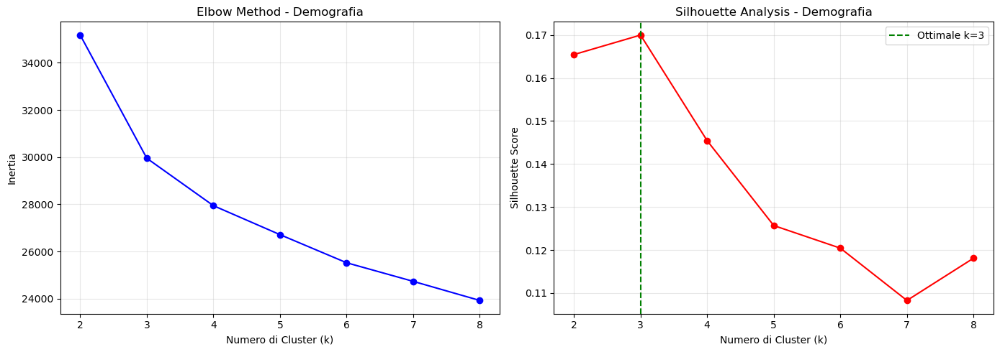


Metriche KMeans (k=3):
  Silhouette: 0.170
  Davies-Bouldin: 1.797
  Calinski-Harabasz: 2194.0

Statistiche Cluster KMeans:
         Size  Churned  Churn_Rate
Cluster                           
0        4277      731    0.170914
1        3261      520    0.159460
2        2589      376    0.145230

--- Visualizzazioni KMeans ---


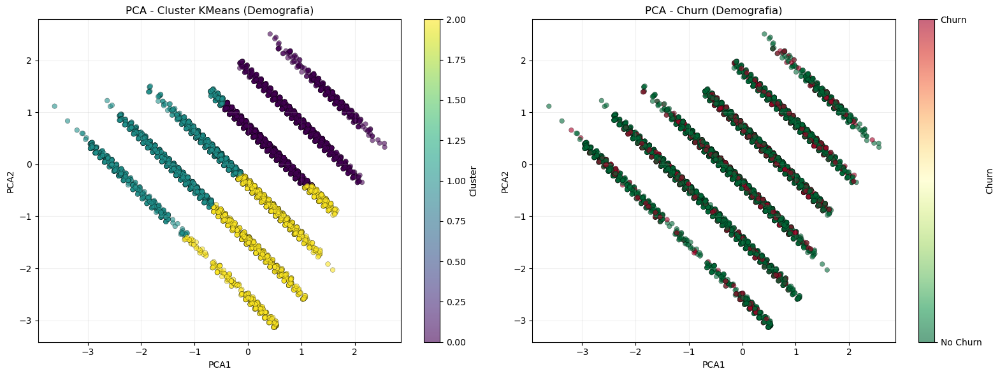


Varianza spiegata da PCA: 47.26%
  - PC1: 26.50%
  - PC2: 20.77%


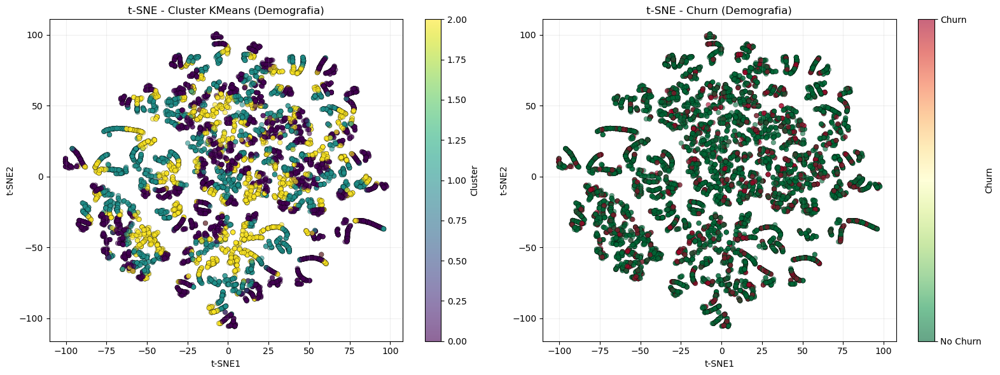


CARATTERIZZAZIONE CLUSTER - Demografia (KMeans)


--- CLUSTER 0 (n=4277) ---

Caratteristiche numeriche medie:
  Customer_Age: 45.73 (media generale: 46.33, diff: -1.3%)
  Dependent_count: 3.57 (media generale: 2.35, diff: +52.0%)

Distribuzione variabili categoriche:
  Gender: F (52.7%)
  Education_Level: Graduate (31.1%)
  Marital_Status: Married (46.3%)
  Income_Category: Less than $40K (33.6%)

--- CLUSTER 1 (n=3261) ---

Caratteristiche numeriche medie:
  Customer_Age: 54.19 (media generale: 46.33, diff: +17.0%)
  Dependent_count: 1.35 (media generale: 2.35, diff: -42.5%)

Distribuzione variabili categoriche:
  Gender: F (53.6%)
  Education_Level: Graduate (30.2%)
  Marital_Status: Married (50.3%)
  Income_Category: Less than $40K (35.4%)

--- CLUSTER 2 (n=2589) ---

Caratteristiche numeriche medie:
  Customer_Age: 37.40 (media generale: 46.33, diff: -19.3%)
  Dependent_count: 1.59 (media generale: 2.35, diff: -32.4%)

Distribuzione variabili categoriche:
  Gender: F (52.3%)
  Ed

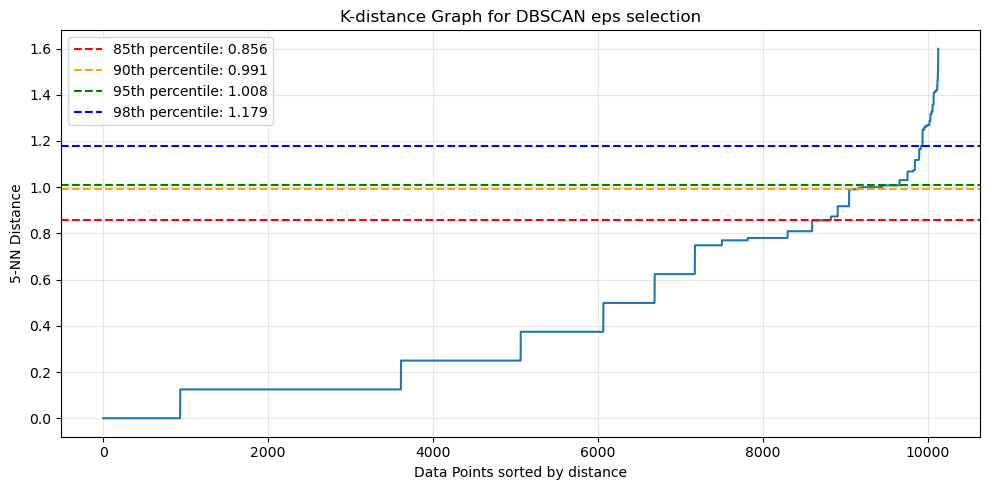


Test diversi valori di eps:
 percentile      eps  n_clusters  n_noise  noise_pct  silhouette
         85 0.856049         184      887   8.758764   -0.027363
         90 0.990856         184      580   5.727264   -0.009937
         95 1.007750           2      148   1.461440    0.073519
         98 1.178570           1       49   0.483855   -1.000000

✓ Miglior eps: 1.0078 (percentile 95)
  Silhouette: 0.074
  Cluster: 2

Parametri finali DBSCAN:
  eps: 1.0078
  min_samples: 5
  Cluster trovati: 2
  Punti di rumore: 148 (1.5%)

Metriche DBSCAN:
  Silhouette: 0.074
  Davies-Bouldin: 2.959
  Calinski-Harabasz: 28.7

Statistiche Cluster DBSCAN:
         Size  Churned  Churn_Rate
Cluster                           
-1        148       23    0.155405
 0       9974     1604    0.160818
 1          5        0    0.000000

--- Visualizzazioni DBSCAN ---


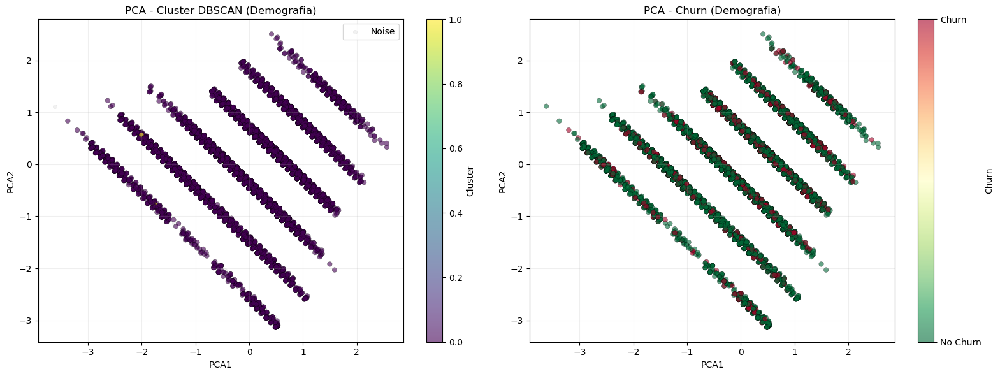


Varianza spiegata da PCA: 47.26%
  - PC1: 26.50%
  - PC2: 20.77%


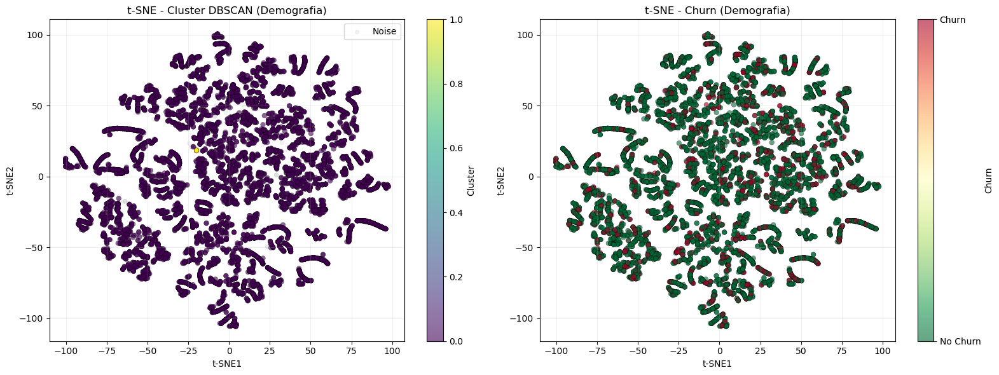


CARATTERIZZAZIONE CLUSTER - Demografia (DBSCAN)


--- CLUSTER 0 (n=9974) ---

Caratteristiche numeriche medie:
  Customer_Age: 46.34 (media generale: 46.35, diff: -0.0%)
  Dependent_count: 2.36 (media generale: 2.36, diff: +0.0%)

Distribuzione variabili categoriche:
  Gender: F (53.1%)
  Education_Level: Graduate (31.2%)
  Marital_Status: Married (46.8%)
  Income_Category: Less than $40K (35.4%)

--- CLUSTER 1 (n=5) ---

Caratteristiche numeriche medie:
  Customer_Age: 57.40 (media generale: 46.35, diff: +23.8%)
  Dependent_count: 0.80 (media generale: 2.36, diff: -66.2%)

Distribuzione variabili categoriche:
  Gender: F (100.0%)
  Education_Level: Graduate (100.0%)
  Marital_Status: Unknown (100.0%)
  Income_Category: $40K - $60K (100.0%)


ANALISI BLOCCO: Comportamento
Feature: ['Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Total_Relationship_Count']

Shape dati trasformati: (10127, 4)

────────────────────────────────────────────────────────────────────────

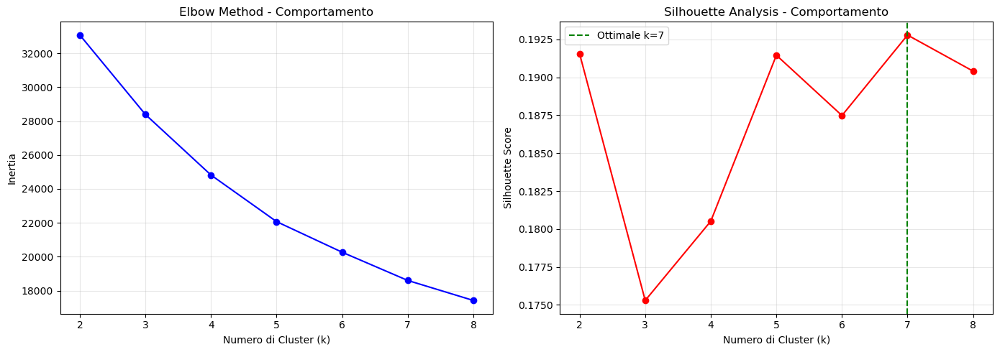


Metriche KMeans (k=7):
  Silhouette: 0.193
  Davies-Bouldin: 1.324
  Calinski-Harabasz: 1986.4

Statistiche Cluster KMeans:
         Size  Churned  Churn_Rate
Cluster                           
0        1185      159    0.134177
1        1887      244    0.129306
2        1507      484    0.321168
3         651      156    0.239631
4        1120      113    0.100893
5        1926      156    0.080997
6        1851      315    0.170178

--- Visualizzazioni KMeans ---


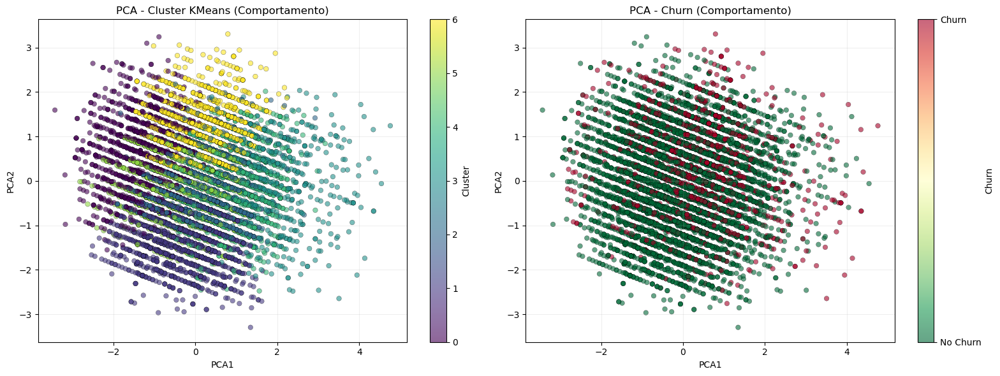


Varianza spiegata da PCA: 53.38%
  - PC1: 26.92%
  - PC2: 26.47%


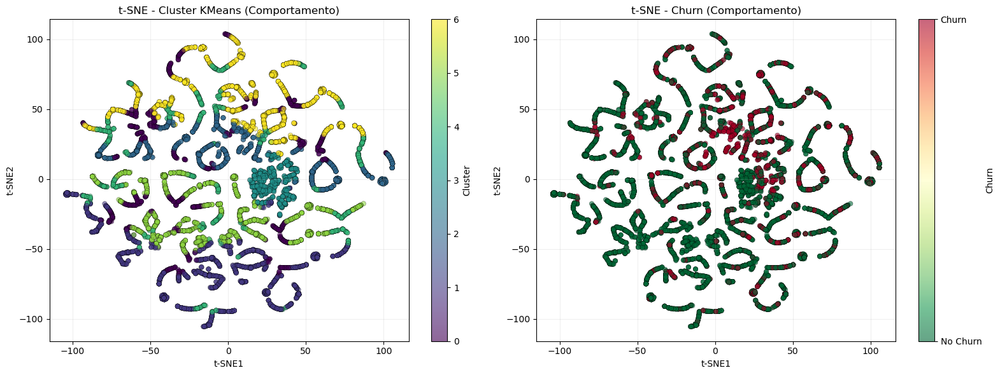


CARATTERIZZAZIONE CLUSTER - Comportamento (KMeans)


--- CLUSTER 0 (n=1185) ---

Caratteristiche numeriche medie:
  Months_on_book: 22.44 (media generale: 35.93, diff: -37.5%)
  Months_Inactive_12_mon: 2.03 (media generale: 2.34, diff: -13.3%)
  Contacts_Count_12_mon: 2.67 (media generale: 2.46, diff: +8.7%)
  Total_Relationship_Count: 4.01 (media generale: 3.81, diff: +5.1%)

--- CLUSTER 1 (n=1887) ---

Caratteristiche numeriche medie:
  Months_on_book: 36.16 (media generale: 35.93, diff: +0.6%)
  Months_Inactive_12_mon: 2.21 (media generale: 2.34, diff: -5.6%)
  Contacts_Count_12_mon: 1.49 (media generale: 2.46, diff: -39.3%)
  Total_Relationship_Count: 2.19 (media generale: 3.81, diff: -42.6%)

--- CLUSTER 2 (n=1507) ---

Caratteristiche numeriche medie:
  Months_on_book: 35.93 (media generale: 35.93, diff: +0.0%)
  Months_Inactive_12_mon: 2.27 (media generale: 2.34, diff: -3.0%)
  Contacts_Count_12_mon: 3.36 (media generale: 2.46, diff: +36.8%)
  Total_Relationship_Count: 2.25 (me

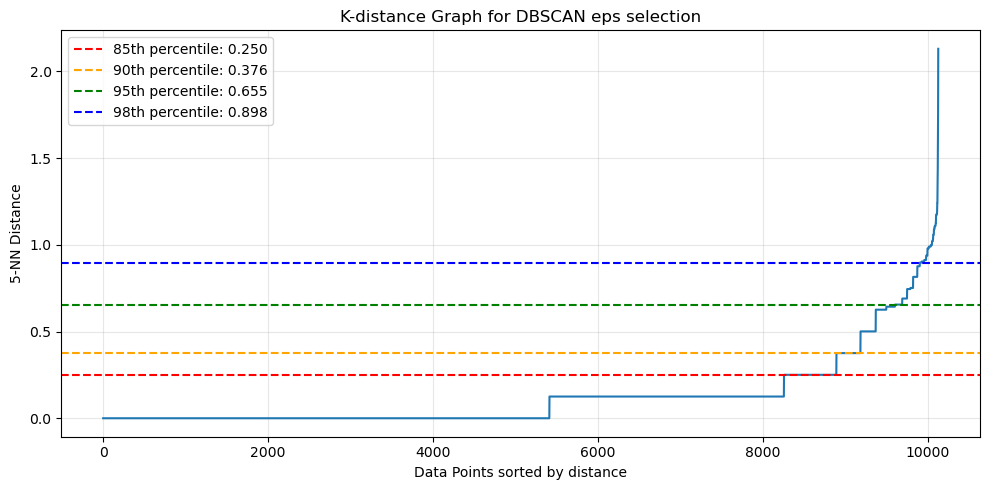


Test diversi valori di eps:
 percentile      eps  n_clusters  n_noise  noise_pct  silhouette
         85 0.250438         173      999   9.864718    0.089505
         90 0.375656         140      781   7.712057    0.120376
         95 0.655436          37      330   3.258616    0.044615
         98 0.897725          34      114   1.125704    0.101968

✓ Miglior eps: 0.3757 (percentile 90)
  Silhouette: 0.120
  Cluster: 140

Parametri finali DBSCAN:
  eps: 0.3757
  min_samples: 5
  Cluster trovati: 140
  Punti di rumore: 781 (7.7%)

Metriche DBSCAN:
  Silhouette: 0.120
  Davies-Bouldin: 2.082
  Calinski-Harabasz: 120.6

Statistiche Cluster DBSCAN:
         Size  Churned  Churn_Rate
Cluster                           
-1        781      220    0.281690
 0        125        5    0.040000
 1        131        2    0.015267
 2          9        0    0.000000
 3         11        0    0.000000
...       ...      ...         ...
 135        6        6    1.000000
 136        5        4    0.8

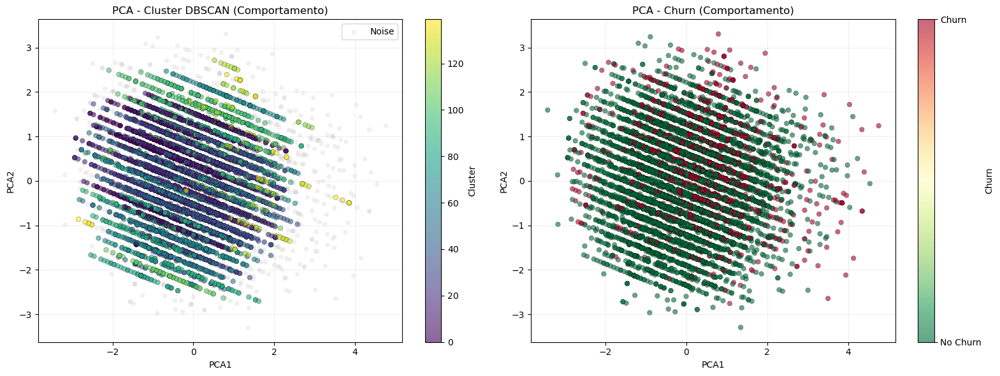


Varianza spiegata da PCA: 53.38%
  - PC1: 26.92%
  - PC2: 26.47%


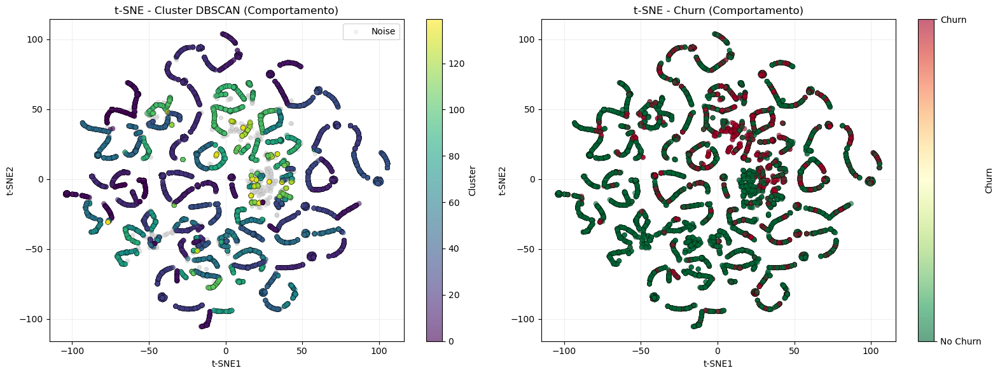


CARATTERIZZAZIONE CLUSTER - Comportamento (DBSCAN)


--- CLUSTER 0 (n=125) ---

Caratteristiche numeriche medie:
  Months_on_book: 34.88 (media generale: 35.87, diff: -2.8%)
  Months_Inactive_12_mon: 1.00 (media generale: 2.27, diff: -55.9%)
  Contacts_Count_12_mon: 3.00 (media generale: 2.43, diff: +23.5%)
  Total_Relationship_Count: 5.00 (media generale: 3.83, diff: +30.6%)

--- CLUSTER 1 (n=131) ---

Caratteristiche numeriche medie:
  Months_on_book: 36.25 (media generale: 35.87, diff: +1.1%)
  Months_Inactive_12_mon: 1.00 (media generale: 2.27, diff: -55.9%)
  Contacts_Count_12_mon: 2.00 (media generale: 2.43, diff: -17.7%)
  Total_Relationship_Count: 6.00 (media generale: 3.83, diff: +56.8%)

--- CLUSTER 2 (n=9) ---

Caratteristiche numeriche medie:
  Months_on_book: 36.00 (media generale: 35.87, diff: +0.4%)
  Months_Inactive_12_mon: 1.00 (media generale: 2.27, diff: -55.9%)
  Contacts_Count_12_mon: 0.00 (media generale: 2.43, diff: -100.0%)
  Total_Relationship_Count: 4.00 (med

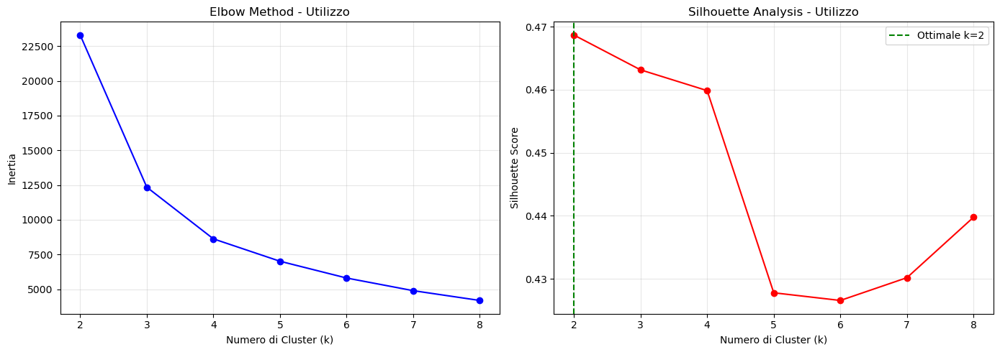


Metriche KMeans (k=2):
  Silhouette: 0.469
  Davies-Bouldin: 0.871
  Calinski-Harabasz: 7474.6

Statistiche Cluster KMeans:
         Size  Churned  Churn_Rate
Cluster                           
0        1994      296    0.148445
1        8133     1331    0.163654

--- Visualizzazioni KMeans ---


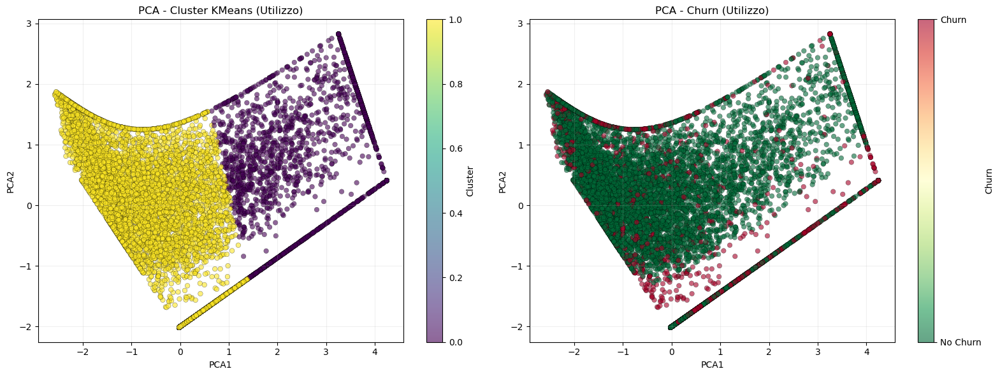


Varianza spiegata da PCA: 94.65%
  - PC1: 61.08%
  - PC2: 33.56%


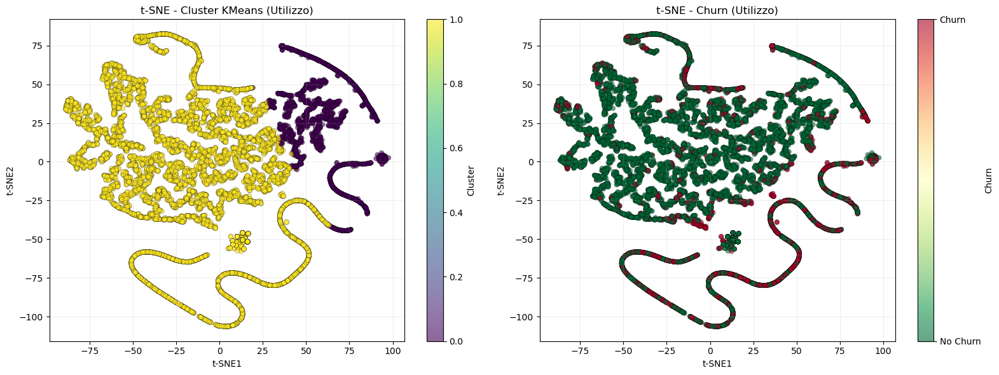


CARATTERIZZAZIONE CLUSTER - Utilizzo (KMeans)


--- CLUSTER 0 (n=1994) ---

Caratteristiche numeriche medie:
  Credit_Limit: 24672.67 (media generale: 8631.95, diff: +185.8%)
  Total_Revolving_Bal: 1117.22 (media generale: 1162.81, diff: -3.9%)
  Avg_Open_To_Buy: 23555.45 (media generale: 7469.14, diff: +215.4%)
  Avg_Utilization_Ratio: 0.05 (media generale: 0.27, diff: -82.6%)

--- CLUSTER 1 (n=8133) ---

Caratteristiche numeriche medie:
  Credit_Limit: 4699.19 (media generale: 8631.95, diff: -45.6%)
  Total_Revolving_Bal: 1173.99 (media generale: 1162.81, diff: +1.0%)
  Avg_Open_To_Buy: 3525.19 (media generale: 7469.14, diff: -52.8%)
  Avg_Utilization_Ratio: 0.33 (media generale: 0.27, diff: +20.3%)

────────────────────────────────────────────────────────────────────────────────
DBSCAN CLUSTERING
────────────────────────────────────────────────────────────────────────────────

Ricerca eps ottimale (min_samples=5)...


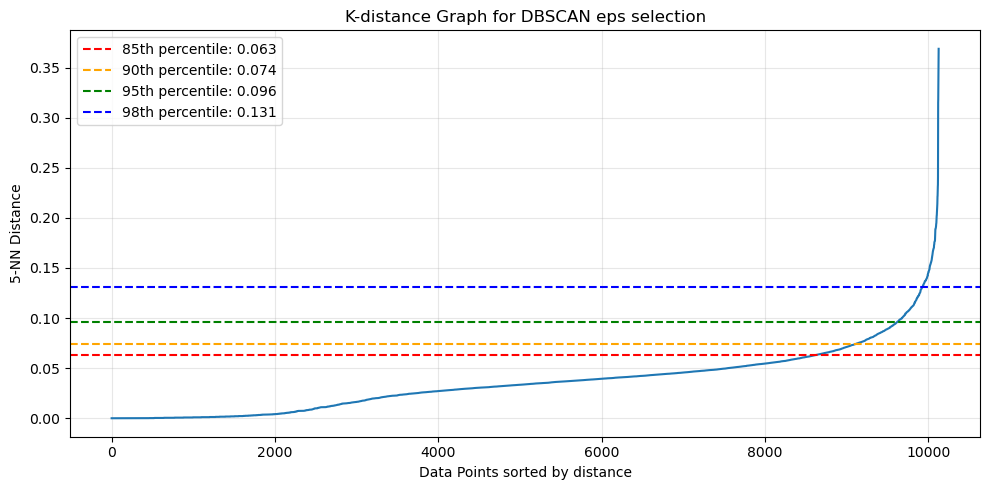


Test diversi valori di eps:
 percentile      eps  n_clusters  n_noise  noise_pct  silhouette
         85 0.062780          83      939   9.272243   -0.378226
         90 0.074267          57      625   6.171620   -0.199067
         95 0.096265          35      292   2.883381   -0.309569
         98 0.130655          11       95   0.938086   -0.080944

✓ Miglior eps: 0.1307 (percentile 98)
  Silhouette: -0.081
  Cluster: 11

Parametri finali DBSCAN:
  eps: 0.1307
  min_samples: 5
  Cluster trovati: 11
  Punti di rumore: 95 (0.9%)

Metriche DBSCAN:
  Silhouette: -0.081
  Davies-Bouldin: 1.491
  Calinski-Harabasz: 906.8

Statistiche Cluster DBSCAN:
         Size  Churned  Churn_Rate
Cluster                           
-1         95       41    0.431579
 0       7011      614    0.087577
 1       2470      893    0.361538
 2        493       47    0.095335
 3          4        0    0.000000
 4          7        1    0.142857
 5         12        1    0.083333
 6          9        9    1.00

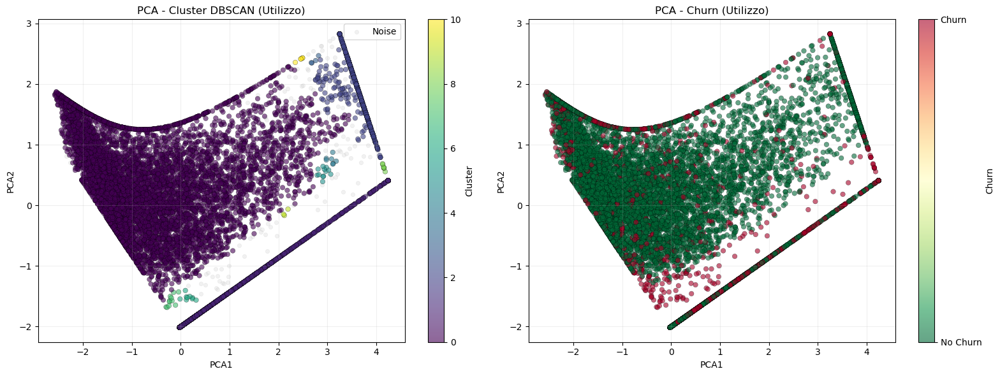


Varianza spiegata da PCA: 94.65%
  - PC1: 61.08%
  - PC2: 33.56%


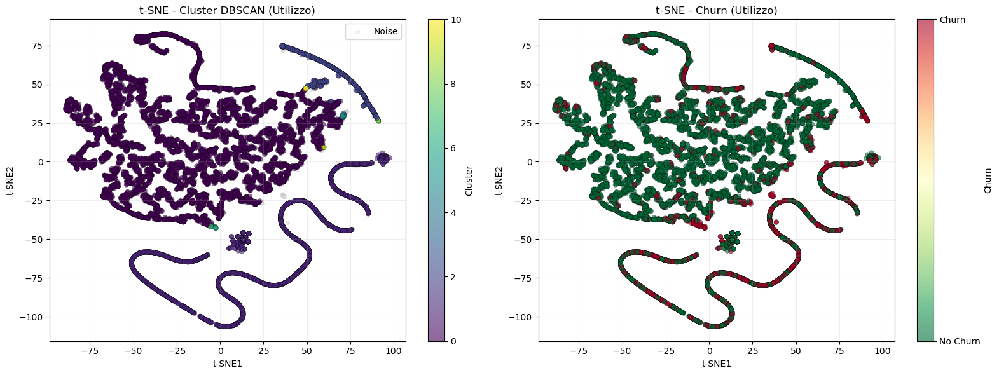


CARATTERIZZAZIONE CLUSTER - Utilizzo (DBSCAN)


--- CLUSTER 0 (n=7011) ---

Caratteristiche numeriche medie:
  Credit_Limit: 6771.86 (media generale: 8499.48, diff: -20.3%)
  Total_Revolving_Bal: 1546.56 (media generale: 1163.39, diff: +32.9%)
  Avg_Open_To_Buy: 5225.29 (media generale: 7336.09, diff: -28.8%)
  Avg_Utilization_Ratio: 0.39 (media generale: 0.28, diff: +41.7%)

--- CLUSTER 1 (n=2470) ---

Caratteristiche numeriche medie:
  Credit_Limit: 8039.11 (media generale: 8499.48, diff: -5.4%)
  Total_Revolving_Bal: 0.00 (media generale: 1163.39, diff: -100.0%)
  Avg_Open_To_Buy: 8039.11 (media generale: 7336.09, diff: +9.6%)
  Avg_Utilization_Ratio: 0.00 (media generale: 0.28, diff: -100.0%)

--- CLUSTER 2 (n=493) ---

Caratteristiche numeriche medie:
  Credit_Limit: 34054.49 (media generale: 8499.48, diff: +300.7%)
  Total_Revolving_Bal: 1589.57 (media generale: 1163.39, diff: +36.6%)
  Avg_Open_To_Buy: 32464.92 (media generale: 7336.09, diff: +342.5%)
  Avg_Utilization_Ratio: 0

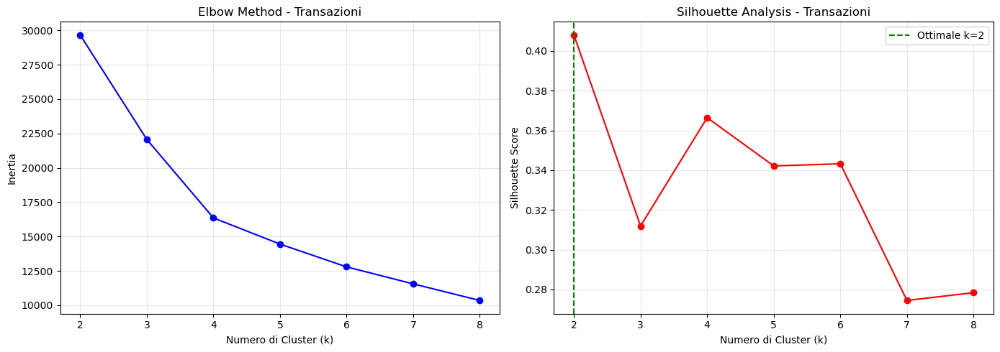


Metriche KMeans (k=2):
  Silhouette: 0.408
  Davies-Bouldin: 0.878
  Calinski-Harabasz: 3705.0

Statistiche Cluster KMeans:
         Size  Churned  Churn_Rate
Cluster                           
0        8916     1544    0.173172
1        1211       83    0.068538

--- Visualizzazioni KMeans ---


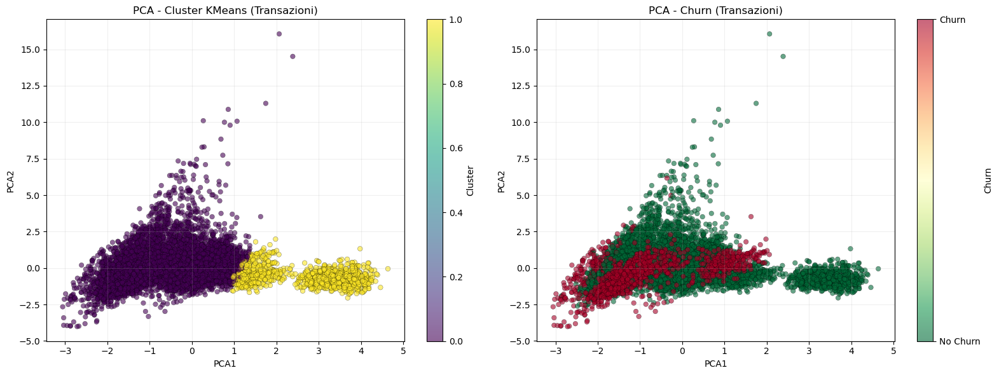


Varianza spiegata da PCA: 79.91%
  - PC1: 46.10%
  - PC2: 33.81%


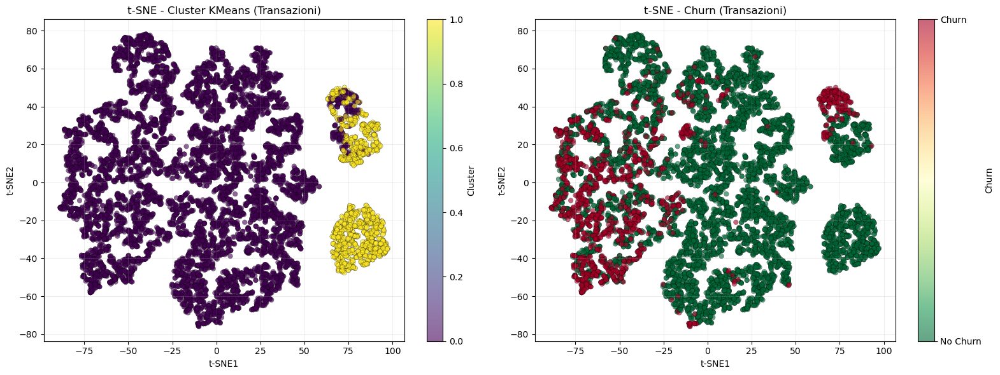


CARATTERIZZAZIONE CLUSTER - Transazioni (KMeans)


--- CLUSTER 0 (n=8916) ---

Caratteristiche numeriche medie:
  Total_Trans_Amt: 3342.13 (media generale: 4404.09, diff: -24.1%)
  Total_Trans_Ct: 59.74 (media generale: 64.86, diff: -7.9%)
  Total_Amt_Chng_Q4_Q1: 0.76 (media generale: 0.76, diff: -0.4%)
  Total_Ct_Chng_Q4_Q1: 0.71 (media generale: 0.71, diff: -0.2%)

--- CLUSTER 1 (n=1211) ---

Caratteristiche numeriche medie:
  Total_Trans_Amt: 12222.76 (media generale: 4404.09, diff: +177.5%)
  Total_Trans_Ct: 102.57 (media generale: 64.86, diff: +58.1%)
  Total_Amt_Chng_Q4_Q1: 0.78 (media generale: 0.76, diff: +2.6%)
  Total_Ct_Chng_Q4_Q1: 0.72 (media generale: 0.71, diff: +1.7%)

────────────────────────────────────────────────────────────────────────────────
DBSCAN CLUSTERING
────────────────────────────────────────────────────────────────────────────────

Ricerca eps ottimale (min_samples=5)...


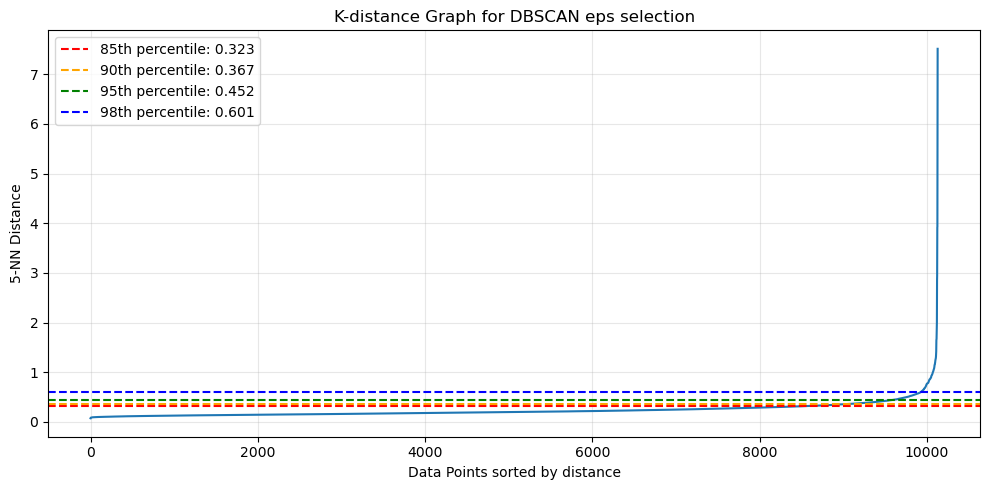


Test diversi valori di eps:
 percentile      eps  n_clusters  n_noise  noise_pct  silhouette
         85 0.323015          24      883   8.719265   -0.093494
         90 0.367398          12      556   5.490274    0.023714
         95 0.451708           7      277   2.735262    0.357778
         98 0.600945           3      144   1.421941    0.479878

✓ Miglior eps: 0.6009 (percentile 98)
  Silhouette: 0.480
  Cluster: 3

Parametri finali DBSCAN:
  eps: 0.6009
  min_samples: 5
  Cluster trovati: 3
  Punti di rumore: 144 (1.4%)

Metriche DBSCAN:
  Silhouette: 0.480
  Davies-Bouldin: 1.611
  Calinski-Harabasz: 1615.1

Statistiche Cluster DBSCAN:
         Size  Churned  Churn_Rate
Cluster                           
-1        144       28    0.194444
 0       9231     1599    0.173221
 1         11        0    0.000000
 2        741        0    0.000000

--- Visualizzazioni DBSCAN ---


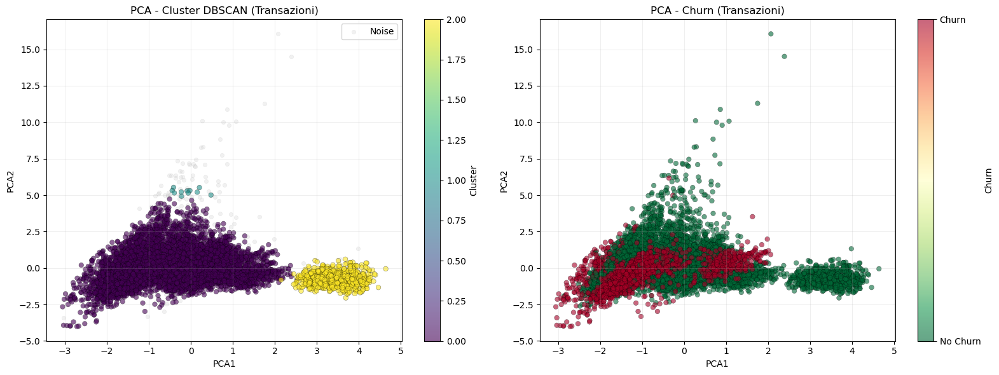


Varianza spiegata da PCA: 79.91%
  - PC1: 46.10%
  - PC2: 33.81%


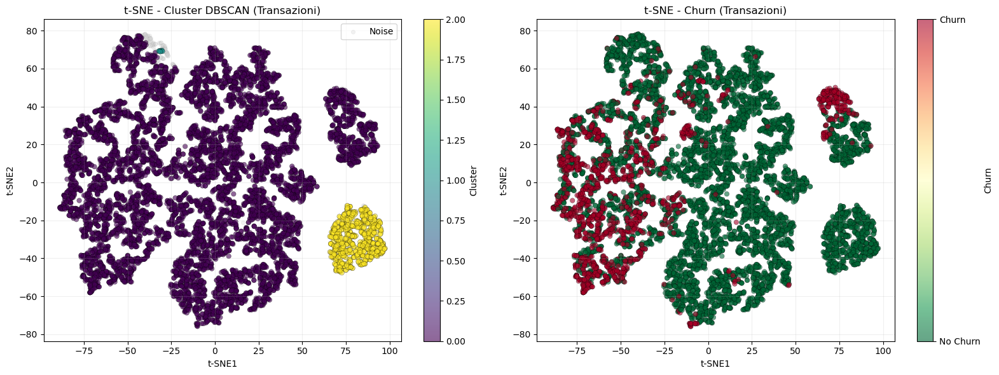


CARATTERIZZAZIONE CLUSTER - Transazioni (DBSCAN)


--- CLUSTER 0 (n=9231) ---

Caratteristiche numeriche medie:
  Total_Trans_Amt: 3600.70 (media generale: 4422.56, diff: -18.6%)
  Total_Trans_Ct: 61.62 (media generale: 65.21, diff: -5.5%)
  Total_Amt_Chng_Q4_Q1: 0.75 (media generale: 0.75, diff: -0.3%)
  Total_Ct_Chng_Q4_Q1: 0.70 (media generale: 0.70, diff: -0.8%)

--- CLUSTER 1 (n=11) ---

Caratteristiche numeriche medie:
  Total_Trans_Amt: 1628.18 (media generale: 4422.56, diff: -63.2%)
  Total_Trans_Ct: 31.91 (media generale: 65.21, diff: -51.1%)
  Total_Amt_Chng_Q4_Q1: 1.21 (media generale: 0.75, diff: +61.4%)
  Total_Ct_Chng_Q4_Q1: 1.92 (media generale: 0.70, diff: +174.2%)

--- CLUSTER 2 (n=741) ---

Caratteristiche numeriche medie:
  Total_Trans_Amt: 14702.29 (media generale: 4422.56, diff: +232.4%)
  Total_Trans_Ct: 110.39 (media generale: 65.21, diff: +69.3%)
  Total_Amt_Chng_Q4_Q1: 0.77 (media generale: 0.75, diff: +2.8%)
  Total_Ct_Chng_Q4_Q1: 0.75 (media generale: 0.70, 

In [6]:
# =======================
# ESEMPIO DI UTILIZZO PER TUTTI I BLOCCHI
# =======================
results_summary = []
cluster_labels_storage = {}

for block_name, features in blocks.items():
    results_km, results_db, labels_km, labels_db = analyze_block_complete(
        block_name, features, df_clean, max_k=8, dbscan_min_samples=5
    )
    
    results_summary.append(results_km)
    if results_db is not None:
        results_summary.append(results_db)
    
    cluster_labels_storage[f"{block_name}_KMeans"] = labels_km
    cluster_labels_storage[f"{block_name}_DBSCAN"] = labels_db




################################################################################
# CLUSTERING CON TUTTE LE FEATURE
################################################################################

Feature utilizzate: 19


ANALISI BLOCCO: Tutte le Feature
Feature: ['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.

Shape dati trasformati: (10127, 32)

────────────────────────────────────────────────────────────────────────────────
KMEANS CLUSTERING
────────────────────────────────────────────────────────────

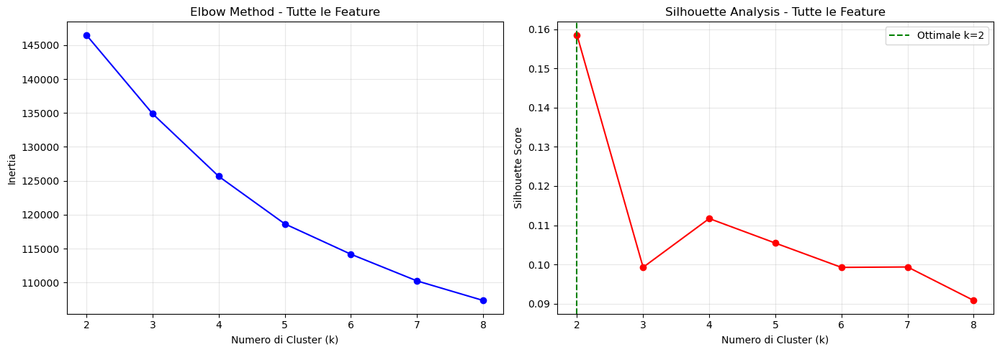


Metriche KMeans (k=2):
  Silhouette: 0.158
  Davies-Bouldin: 2.282
  Calinski-Harabasz: 1287.2

Statistiche Cluster KMeans:
         Size  Churned  Churn_Rate
Cluster                           
0        7942     1327    0.167086
1        2185      300    0.137300

--- Visualizzazioni KMeans ---


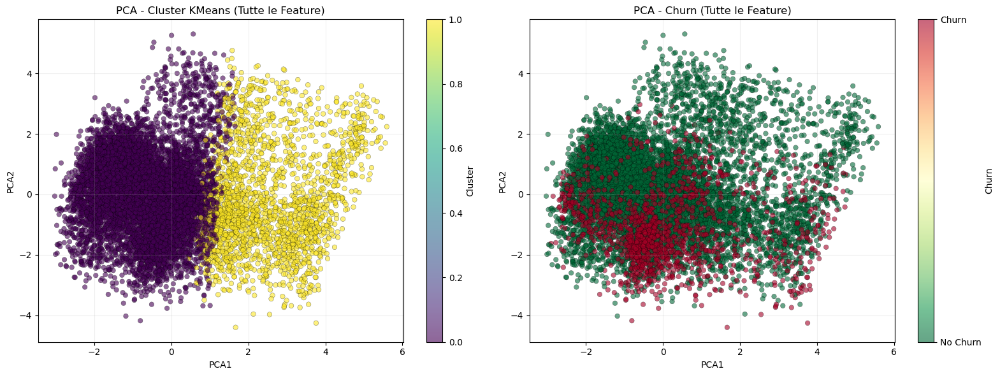


Varianza spiegata da PCA: 28.96%
  - PC1: 16.33%
  - PC2: 12.63%


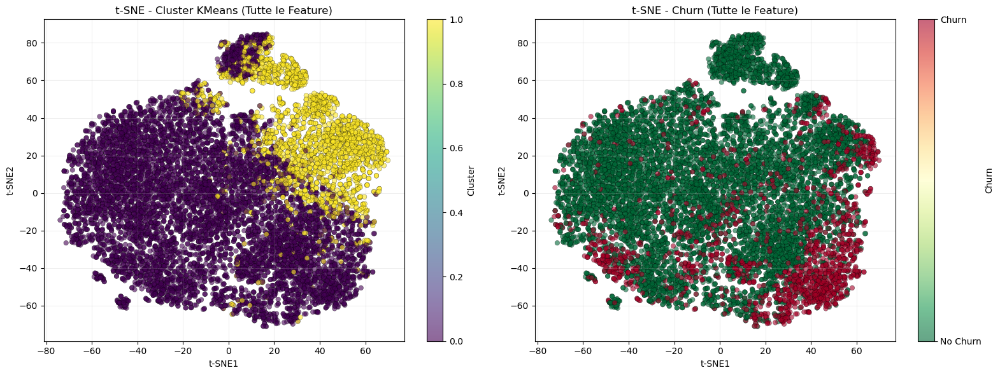


CARATTERIZZAZIONE CLUSTER - Tutte le Feature (KMeans)


--- CLUSTER 0 (n=7942) ---

Caratteristiche numeriche medie:
  Customer_Age: 46.36 (media generale: 46.33, diff: +0.1%)
  Dependent_count: 2.30 (media generale: 2.35, diff: -2.0%)
  Months_on_book: 35.94 (media generale: 35.93, diff: +0.0%)
  Total_Relationship_Count: 3.91 (media generale: 3.81, diff: +2.5%)
  Months_Inactive_12_mon: 2.35 (media generale: 2.34, diff: +0.4%)
  Contacts_Count_12_mon: 2.45 (media generale: 2.46, diff: -0.0%)
  Credit_Limit: 4573.93 (media generale: 8631.95, diff: -47.0%)
  Total_Revolving_Bal: 1169.54 (media generale: 1162.81, diff: +0.6%)
  Avg_Open_To_Buy: 3404.40 (media generale: 7469.14, diff: -54.4%)
  Total_Amt_Chng_Q4_Q1: 0.76 (media generale: 0.76, diff: -0.3%)
  Total_Trans_Amt: 3915.34 (media generale: 4404.09, diff: -11.1%)
  Total_Trans_Ct: 62.76 (media generale: 64.86, diff: -3.2%)
  Total_Ct_Chng_Q4_Q1: 0.71 (media generale: 0.71, diff: -0.0%)
  Avg_Utilization_Ratio: 0.34 (media gener

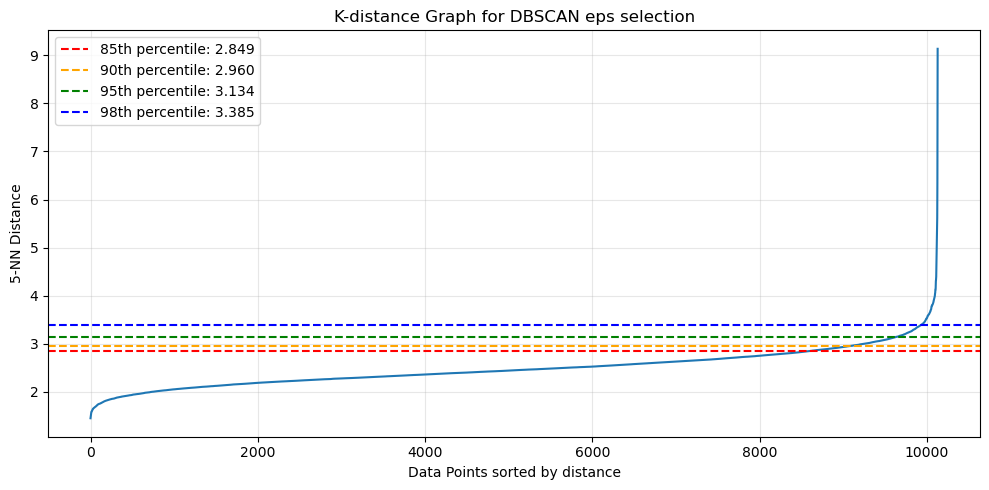


Test diversi valori di eps:
 percentile      eps  n_clusters  n_noise  noise_pct  silhouette
         85 2.849415           1      599   5.914881   -1.000000
         90 2.960374           1      369   3.643725   -1.000000
         95 3.134039           2      185   1.826800    0.213101
         98 3.385368           1       77   0.760344   -1.000000

✓ Miglior eps: 3.1340 (percentile 95)
  Silhouette: 0.213
  Cluster: 2

Parametri finali DBSCAN:
  eps: 3.1340
  min_samples: 5
  Cluster trovati: 2
  Punti di rumore: 185 (1.8%)

Metriche DBSCAN:
  Silhouette: 0.213
  Davies-Bouldin: 2.761
  Calinski-Harabasz: 59.9

Statistiche Cluster DBSCAN:
         Size  Churned  Churn_Rate
Cluster                           
-1        185       39    0.210811
 0       9938     1588    0.159791
 1          4        0    0.000000

--- Visualizzazioni DBSCAN ---


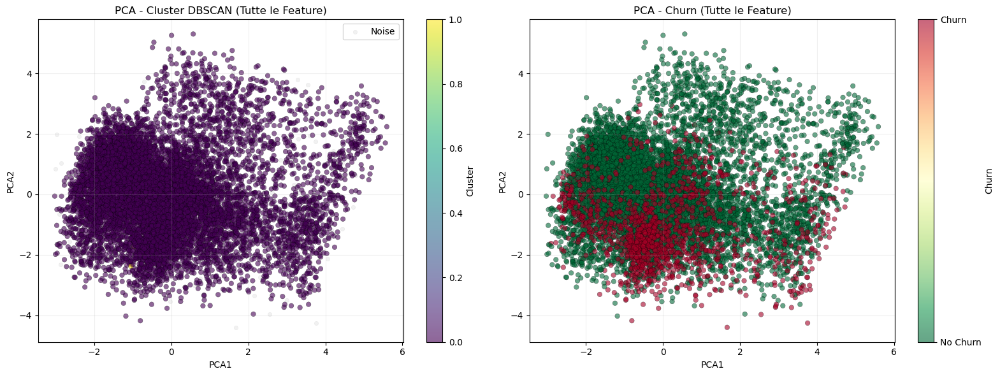


Varianza spiegata da PCA: 28.96%
  - PC1: 16.33%
  - PC2: 12.63%


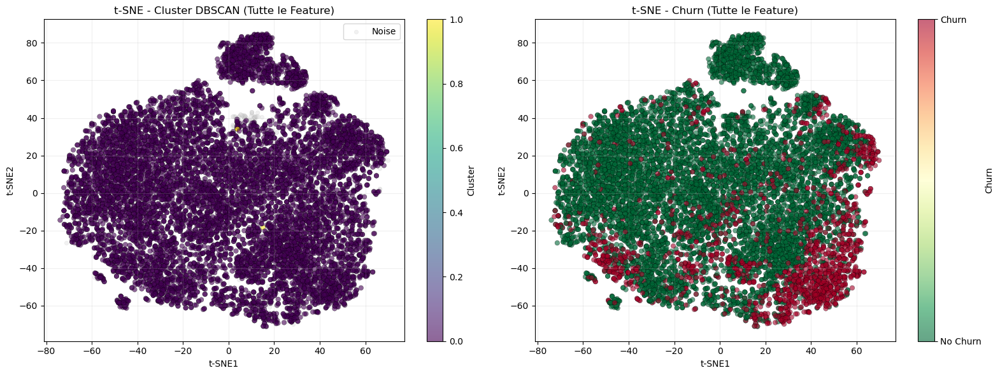


CARATTERIZZAZIONE CLUSTER - Tutte le Feature (DBSCAN)


--- CLUSTER 0 (n=9938) ---

Caratteristiche numeriche medie:
  Customer_Age: 46.30 (media generale: 46.31, diff: -0.0%)
  Dependent_count: 2.35 (media generale: 2.35, diff: +0.0%)
  Months_on_book: 35.91 (media generale: 35.91, diff: -0.0%)
  Total_Relationship_Count: 3.81 (media generale: 3.81, diff: -0.0%)
  Months_Inactive_12_mon: 2.33 (media generale: 2.33, diff: -0.0%)
  Contacts_Count_12_mon: 2.45 (media generale: 2.45, diff: -0.0%)
  Credit_Limit: 8534.62 (media generale: 8532.26, diff: +0.0%)
  Total_Revolving_Bal: 1158.50 (media generale: 1158.03, diff: +0.0%)
  Avg_Open_To_Buy: 7376.13 (media generale: 7374.23, diff: +0.0%)
  Total_Amt_Chng_Q4_Q1: 0.75 (media generale: 0.75, diff: -0.0%)
  Total_Trans_Amt: 4416.01 (media generale: 4415.02, diff: +0.0%)
  Total_Trans_Ct: 65.21 (media generale: 65.20, diff: +0.0%)
  Total_Ct_Chng_Q4_Q1: 0.70 (media generale: 0.70, diff: -0.0%)
  Avg_Utilization_Ratio: 0.28 (media generale

In [7]:
# =======================
# CLUSTERING CON TUTTE LE FEATURE
# =======================
print(f"\n\n{'#' * 80}")
print(f"# CLUSTERING CON TUTTE LE FEATURE")
print(f"{'#' * 80}\n")

all_features = [col for col in df_clean.columns if col not in ["Attrition_Flag"]]
print(f"Feature utilizzate: {len(all_features)}")

results_km_all, results_db_all, labels_km_all, labels_db_all = analyze_block_complete(
    "Tutte le Feature", all_features, df_clean, max_k=8, dbscan_min_samples=5
)

results_summary.append(results_km_all)
if results_db_all is not None:
    results_summary.append(results_db_all)

cluster_labels_storage["All_Features_KMeans"] = labels_km_all
cluster_labels_storage["All_Features_DBSCAN"] = labels_db_all


In [8]:
# =======================
# RIEPILOGO FINALE
# =======================
print(f"\n\n{'#' * 80}")
print(f"# RIEPILOGO COMPARATIVO")
print(f"{'#' * 80}\n")

df_results = pd.DataFrame(results_summary)
print(df_results.to_string(index=False))

print(f"\n\nMigliori 5 configurazioni per Silhouette Score:")
print(df_results.nlargest(5, 'Silhouette')[['Block', 'N_Clusters', 'Silhouette', 
                                              'Davies_Bouldin', 'Calinski_Harabasz']])

print(f"\n\nConfronti DBSCAN vs KMeans per blocco:")
for block_name in blocks.keys():
    km_row = df_results[df_results['Block'] == f"{block_name} (KMeans)"]
    db_row = df_results[df_results['Block'] == f"{block_name} (DBSCAN)"]
    if len(km_row) > 0 and len(db_row) > 0:
        km_sil = km_row.iloc[0]['Silhouette']
        db_sil = db_row.iloc[0]['Silhouette']
        winner = "DBSCAN" if db_sil > km_sil else "KMeans"
        print(f"  {block_name}: KMeans={km_sil:.3f} vs DBSCAN={db_sil:.3f} → Migliore: {winner}")

# Salva risultati
df_clean_with_clusters = df_clean.copy()
for name, labels in cluster_labels_storage.items():
    if labels is not None:
        df_clean_with_clusters[f'Cluster_{name}'] = labels

print(f"\n\nDataset con cluster salvato: {df_clean_with_clusters.shape}")
print(f"Nuove colonne cluster: {[c for c in df_clean_with_clusters.columns if 'Cluster_' in c]}")

print("\n" + "=" * 80)
print("ANALISI COMPLETATA")
print("=" * 80)



################################################################################
# RIEPILOGO COMPARATIVO
################################################################################

                    Block  N_Clusters  Silhouette  Davies_Bouldin  Calinski_Harabasz
      Demografia (KMeans)           3    0.169992        1.796843        2194.024142
      Demografia (DBSCAN)           2    0.073519        2.958749          28.651683
   Comportamento (KMeans)           7    0.192782        1.323882        1986.405312
   Comportamento (DBSCAN)         140    0.120376        2.082161         120.622865
        Utilizzo (KMeans)           2    0.468676        0.870531        7474.626698
        Utilizzo (DBSCAN)          11   -0.080944        1.490893         906.824272
     Transazioni (KMeans)           2    0.407972        0.877742        3705.029334
     Transazioni (DBSCAN)           3    0.479878        1.610624        1615.066562
Tutte le Feature (KMeans)           2    0.158